In [57]:
## import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

lending_data = pd.read_csv("/Users/pothururohit/Library/Mobile Documents/com~apple~CloudDocs/IITB - PG in ML/Lending Club Case Study/loan.csv")
lending_data.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN


In [58]:
lending_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Columns: 111 entries, id to total_il_high_credit_limit
dtypes: float64(74), int64(13), object(24)
memory usage: 33.6+ MB


In [59]:
lending_data.isnull().sum()

id                                0
member_id                         0
loan_amnt                         0
funded_amnt                       0
funded_amnt_inv                   0
                              ...  
tax_liens                        39
tot_hi_cred_lim               39717
total_bal_ex_mort             39717
total_bc_limit                39717
total_il_high_credit_limit    39717
Length: 111, dtype: int64

In [60]:
# Dropping all Nulls in the columns

In [61]:
lending_data.dropna(axis = 1, how = 'all', inplace = True)
lending_data.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,policy_code,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,Sep-13,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,NaN,Apr-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,Jun-16,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0


In [62]:
column_names = lending_data.columns.values.tolist()
print(column_names)

['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title', 'emp_length', 'home_ownership', 'annual_inc', 'verification_status', 'issue_d', 'loan_status', 'pymnt_plan', 'url', 'desc', 'purpose', 'title', 'zip_code', 'addr_state', 'dti', 'delinq_2yrs', 'earliest_cr_line', 'inq_last_6mths', 'mths_since_last_delinq', 'mths_since_last_record', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc', 'initial_list_status', 'out_prncp', 'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'recoveries', 'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt', 'next_pymnt_d', 'last_credit_pull_d', 'collections_12_mths_ex_med', 'policy_code', 'application_type', 'acc_now_delinq', 'chargeoff_within_12_mths', 'delinq_amnt', 'pub_rec_bankruptcies', 'tax_liens']


In [63]:
# We should be focused on factors causing loan default before approval of the loan so we can remove other columns
# Funded amount and recovered amount also doesn't contribute to the final goal 
# Recoveries and collections also shouldn't matter to our analsysis as they are post charge-off
# Payment dates and payment dues do not contribute to the analysis

lending_data.drop(["id", "member_id", "url", "title", "emp_title", "zip_code", "addr_state","desc","out_prncp_inv","total_pymnt_inv","funded_amnt", "delinq_2yrs", "out_prncp", "total_pymnt", "total_rec_prncp", "total_rec_int", "total_rec_late_fee", "recoveries", "collection_recovery_fee", "last_pymnt_d", "last_pymnt_amnt", "next_pymnt_d" , "chargeoff_within_12_mths", "mths_since_last_delinq", "mths_since_last_record"], axis = 1, inplace = True)
lending_data.head()


,loan_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,...,total_acc,initial_list_status,last_credit_pull_d,collections_12_mths_ex_med,policy_code,application_type,acc_now_delinq,delinq_amnt,pub_rec_bankruptcies,tax_liens
0,5000,4975.0,36 months,10.65%,162.87,B,B2,10+ years,RENT,24000.0,...,9,f,May-16,0.0,1,INDIVIDUAL,0,0,0.0,0.0
1,2500,2500.0,60 months,15.27%,59.83,C,C4,< 1 year,RENT,30000.0,...,4,f,Sep-13,0.0,1,INDIVIDUAL,0,0,0.0,0.0
2,2400,2400.0,36 months,15.96%,84.33,C,C5,10+ years,RENT,12252.0,...,10,f,May-16,0.0,1,INDIVIDUAL,0,0,0.0,0.0
3,10000,10000.0,36 months,13.49%,339.31,C,C1,10+ years,RENT,49200.0,...,37,f,Apr-16,0.0,1,INDIVIDUAL,0,0,0.0,0.0
4,3000,3000.0,60 months,12.69%,67.79,B,B5,1 year,RENT,80000.0,...,38,f,May-16,0.0,1,INDIVIDUAL,0,0,0.0,0.0


In [64]:
column_names = lending_data.columns.values.tolist()
print(column_names)

['loan_amnt', 'funded_amnt_inv', 'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_length', 'home_ownership', 'annual_inc', 'verification_status', 'issue_d', 'loan_status', 'pymnt_plan', 'purpose', 'dti', 'earliest_cr_line', 'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc', 'initial_list_status', 'last_credit_pull_d', 'collections_12_mths_ex_med', 'policy_code', 'application_type', 'acc_now_delinq', 'delinq_amnt', 'pub_rec_bankruptcies', 'tax_liens']


In [65]:
#Removing more irrelevant fields from our analysis

lending_data.drop(["policy_code", "acc_now_delinq", "delinq_amnt" , "collections_12_mths_ex_med", "last_credit_pull_d", "earliest_cr_line"], axis = 1, inplace = True)
lending_data.head()

,loan_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,...,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,pub_rec_bankruptcies,tax_liens
0,5000,4975.0,36 months,10.65%,162.87,B,B2,10+ years,RENT,24000.0,...,1,3,0,13648,83.70%,9,f,INDIVIDUAL,0.0,0.0
1,2500,2500.0,60 months,15.27%,59.83,C,C4,< 1 year,RENT,30000.0,...,5,3,0,1687,9.40%,4,f,INDIVIDUAL,0.0,0.0
2,2400,2400.0,36 months,15.96%,84.33,C,C5,10+ years,RENT,12252.0,...,2,2,0,2956,98.50%,10,f,INDIVIDUAL,0.0,0.0
3,10000,10000.0,36 months,13.49%,339.31,C,C1,10+ years,RENT,49200.0,...,1,10,0,5598,21%,37,f,INDIVIDUAL,0.0,0.0
4,3000,3000.0,60 months,12.69%,67.79,B,B5,1 year,RENT,80000.0,...,0,15,0,27783,53.90%,38,f,INDIVIDUAL,0.0,0.0


In [66]:
column_names = lending_data.columns.values.tolist()
print(column_names)

['loan_amnt', 'funded_amnt_inv', 'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_length', 'home_ownership', 'annual_inc', 'verification_status', 'issue_d', 'loan_status', 'pymnt_plan', 'purpose', 'dti', 'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc', 'initial_list_status', 'application_type', 'pub_rec_bankruptcies', 'tax_liens']


In [67]:
# Since we cannnot analyze much with Current active loans and we only have to look at 
# charged off loans and fully paid loans as a business objective we can remove current loans
lending_data["loan_status"].value_counts()


Fully Paid     32950
Charged Off     5627
Current         1140
Name: loan_status, dtype: int64

In [68]:
lending_data = lending_data[lending_data["loan_status"] != "Current"]


In [69]:
lending_data["loan_status"].value_counts()

Fully Paid     32950
Charged Off     5627
Name: loan_status, dtype: int64

In [70]:
#Handling missing values

lending_data.isnull().sum()

loan_amnt                  0
funded_amnt_inv            0
term                       0
int_rate                   0
installment                0
grade                      0
sub_grade                  0
emp_length              1033
home_ownership             0
annual_inc                 0
verification_status        0
issue_d                    0
loan_status                0
pymnt_plan                 0
purpose                    0
dti                        0
inq_last_6mths             0
open_acc                   0
pub_rec                    0
revol_bal                  0
revol_util                50
total_acc                  0
initial_list_status        0
application_type           0
pub_rec_bankruptcies     697
tax_liens                 39
dtype: int64

In [71]:
#Check the most common value in the emp_length column
lending_data['emp_length'].value_counts()

10+ years    8488
< 1 year     4508
2 years      4291
3 years      4012
4 years      3342
5 years      3194
1 year       3169
6 years      2168
7 years      1711
8 years      1435
9 years      1226
Name: emp_length, dtype: int64

In [72]:
# We can replace the null values with the mode as employment tenure > 10 yrs is 
# atleast more than 25 percent of total values

lending_data['emp_length'] = lending_data['emp_length'].fillna(lending_data['emp_length'].mode()[0])

In [73]:
lending_data.isnull().sum()

loan_amnt                 0
funded_amnt_inv           0
term                      0
int_rate                  0
installment               0
grade                     0
sub_grade                 0
emp_length                0
home_ownership            0
annual_inc                0
verification_status       0
issue_d                   0
loan_status               0
pymnt_plan                0
purpose                   0
dti                       0
inq_last_6mths            0
open_acc                  0
pub_rec                   0
revol_bal                 0
revol_util               50
total_acc                 0
initial_list_status       0
application_type          0
pub_rec_bankruptcies    697
tax_liens                39
dtype: int64

In [74]:
lending_data['pub_rec_bankruptcies'].value_counts()

0.0    36238
1.0     1637
2.0        5
Name: pub_rec_bankruptcies, dtype: int64

In [75]:
# We can drop Not Available values for publicly recorded bankruptcies , revol util and tax liens

lending_data.dropna(axis = 0, subset = ['revol_util'] , inplace = True)
lending_data.dropna(axis = 0, subset = ['pub_rec_bankruptcies'] , inplace = True)
lending_data.dropna(axis = 0, subset = ['tax_liens'] , inplace = True)


In [76]:
lending_data.isnull().sum()

loan_amnt               0
funded_amnt_inv         0
term                    0
int_rate                0
installment             0
grade                   0
sub_grade               0
emp_length              0
home_ownership          0
annual_inc              0
verification_status     0
issue_d                 0
loan_status             0
pymnt_plan              0
purpose                 0
dti                     0
inq_last_6mths          0
open_acc                0
pub_rec                 0
revol_bal               0
revol_util              0
total_acc               0
initial_list_status     0
application_type        0
pub_rec_bankruptcies    0
tax_liens               0
dtype: int64

In [77]:
# Before we can perform univariate analysis on continuous data we need to make sure it is numeric and in the standardized format

lending_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 37830 entries, 0 to 39680
Data columns (total 26 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   loan_amnt             37830 non-null  int64  
 1   funded_amnt_inv       37830 non-null  float64
 2   term                  37830 non-null  object 
 3   int_rate              37830 non-null  object 
 4   installment           37830 non-null  float64
 5   grade                 37830 non-null  object 
 6   sub_grade             37830 non-null  object 
 7   emp_length            37830 non-null  object 
 8   home_ownership        37830 non-null  object 
 9   annual_inc            37830 non-null  float64
 10  verification_status   37830 non-null  object 
 11  issue_d               37830 non-null  object 
 12  loan_status           37830 non-null  object 
 13  pymnt_plan            37830 non-null  object 
 14  purpose               37830 non-null  object 
 15  dti                

In [78]:
lending_data['tax_liens'].value_counts()

0.0    37830
Name: tax_liens, dtype: int64

In [79]:
lending_data.head()

,loan_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,...,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,pub_rec_bankruptcies,tax_liens
0,5000,4975.0,36 months,10.65%,162.87,B,B2,10+ years,RENT,24000.0,...,1,3,0,13648,83.70%,9,f,INDIVIDUAL,0.0,0.0
1,2500,2500.0,60 months,15.27%,59.83,C,C4,< 1 year,RENT,30000.0,...,5,3,0,1687,9.40%,4,f,INDIVIDUAL,0.0,0.0
2,2400,2400.0,36 months,15.96%,84.33,C,C5,10+ years,RENT,12252.0,...,2,2,0,2956,98.50%,10,f,INDIVIDUAL,0.0,0.0
3,10000,10000.0,36 months,13.49%,339.31,C,C1,10+ years,RENT,49200.0,...,1,10,0,5598,21%,37,f,INDIVIDUAL,0.0,0.0
5,5000,5000.0,36 months,7.90%,156.46,A,A4,3 years,RENT,36000.0,...,3,9,0,7963,28.30%,12,f,INDIVIDUAL,0.0,0.0


In [80]:
# We can observe that the int rate field has a special character % as well as revol util. So we need to remove that
# Also the employment length needs to be standardized to remove + and < 
# Values are between 0 and 10 where 0 means less than one year and 10 means ten or more years. 
# These are in object format and need to typecasted to int

lending_data["emp_length"] = lending_data["emp_length"].apply(lambda x : 0 if '<' in x else (x[0:2] if '+' in x else x.split()[0]))



In [81]:
lending_data.head()

,loan_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,...,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,pub_rec_bankruptcies,tax_liens
0,5000,4975.0,36 months,10.65%,162.87,B,B2,10,RENT,24000.0,...,1,3,0,13648,83.70%,9,f,INDIVIDUAL,0.0,0.0
1,2500,2500.0,60 months,15.27%,59.83,C,C4,0,RENT,30000.0,...,5,3,0,1687,9.40%,4,f,INDIVIDUAL,0.0,0.0
2,2400,2400.0,36 months,15.96%,84.33,C,C5,10,RENT,12252.0,...,2,2,0,2956,98.50%,10,f,INDIVIDUAL,0.0,0.0
3,10000,10000.0,36 months,13.49%,339.31,C,C1,10,RENT,49200.0,...,1,10,0,5598,21%,37,f,INDIVIDUAL,0.0,0.0
5,5000,5000.0,36 months,7.90%,156.46,A,A4,3,RENT,36000.0,...,3,9,0,7963,28.30%,12,f,INDIVIDUAL,0.0,0.0


In [82]:
lending_data["emp_length"] = pd.to_numeric(lending_data["emp_length"])

In [83]:
lending_data["int_rate"] = pd.to_numeric(lending_data["int_rate"].apply(lambda x : x[:-2]))
lending_data["revol_util"] = pd.to_numeric(lending_data["revol_util"].apply(lambda x : x[:-2]))

lending_data.head()

,loan_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,...,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,pub_rec_bankruptcies,tax_liens
0,5000,4975.0,36 months,10.6,162.87,B,B2,10,RENT,24000.0,...,1,3,0,13648,83.7,9,f,INDIVIDUAL,0.0,0.0
1,2500,2500.0,60 months,15.2,59.83,C,C4,0,RENT,30000.0,...,5,3,0,1687,9.4,4,f,INDIVIDUAL,0.0,0.0
2,2400,2400.0,36 months,15.9,84.33,C,C5,10,RENT,12252.0,...,2,2,0,2956,98.5,10,f,INDIVIDUAL,0.0,0.0
3,10000,10000.0,36 months,13.4,339.31,C,C1,10,RENT,49200.0,...,1,10,0,5598,2.0,37,f,INDIVIDUAL,0.0,0.0
5,5000,5000.0,36 months,7.9,156.46,A,A4,3,RENT,36000.0,...,3,9,0,7963,28.3,12,f,INDIVIDUAL,0.0,0.0


<Axes: >

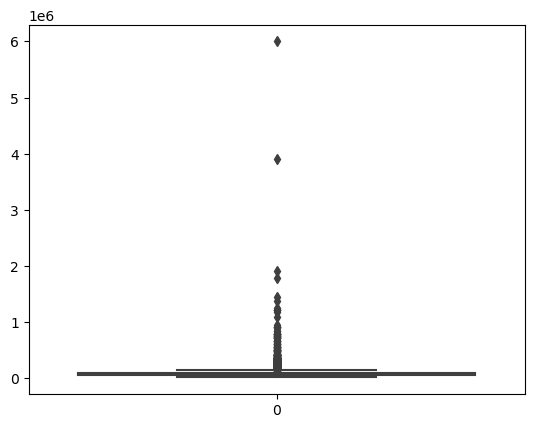

In [84]:
## Now we need to do data cleaning for some of the numerical columns 
sns.boxplot(lending_data['annual_inc'])

In [85]:
## We can see that there are some outliers in the last few quartiles ranges 
# So next step we can check the quartiles to see where we can remove the values

outlier = lending_data['annual_inc'].quantile([0.5, 0.75,0.90, 0.95, 0.97,0.98, 0.99])
outlier

0.50     59000.0
0.75     82000.0
0.90    115000.0
0.95    140004.0
0.97    165000.0
0.98    186000.0
0.99    234000.0
Name: annual_inc, dtype: float64

In [86]:
## We can remove the ones after the 95 Quartile as there is a lot of gap between values 
# for a small increase in quartile range

value_at_95 = lending_data['annual_inc'].quantile(0.95)
lending_data = lending_data[lending_data['annual_inc'] <= value_at_95]

<Axes: >

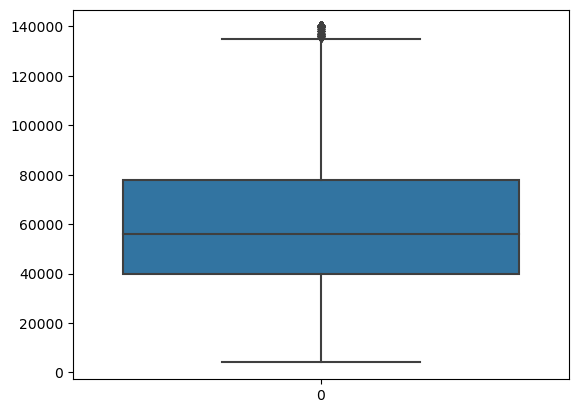

In [87]:
sns.boxplot(lending_data['annual_inc'])

In [88]:
column_names = lending_data.columns.values.tolist()
print(column_names)

['loan_amnt', 'funded_amnt_inv', 'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_length', 'home_ownership', 'annual_inc', 'verification_status', 'issue_d', 'loan_status', 'pymnt_plan', 'purpose', 'dti', 'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc', 'initial_list_status', 'application_type', 'pub_rec_bankruptcies', 'tax_liens']


<Axes: >

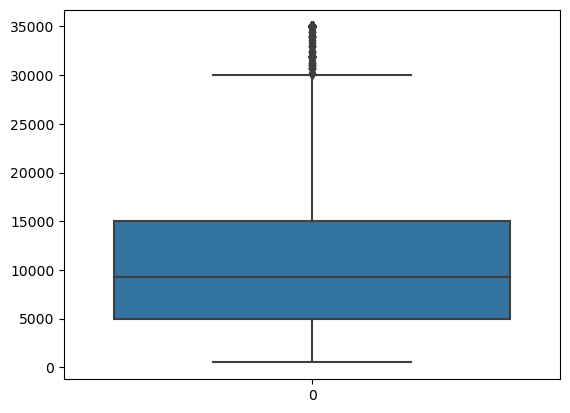

In [89]:
sns.boxplot(lending_data['loan_amnt'])

<Axes: >

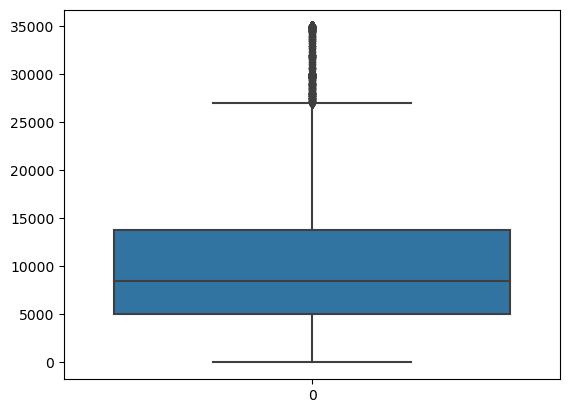

In [90]:
sns.boxplot(lending_data['funded_amnt_inv'])

In [91]:
outlier_loanamt = lending_data['loan_amnt'].quantile([0.5, 0.75,0.90, 0.95, 0.97,0.98, 0.99])
outlier_loanamt

## Loan amount does not display high outliers 

0.50     9250.0
0.75    15000.0
0.90    20000.0
0.95    25000.0
0.97    25975.0
0.98    30000.0
0.99    35000.0
Name: loan_amnt, dtype: float64

<Axes: xlabel='grade', ylabel='Count'>

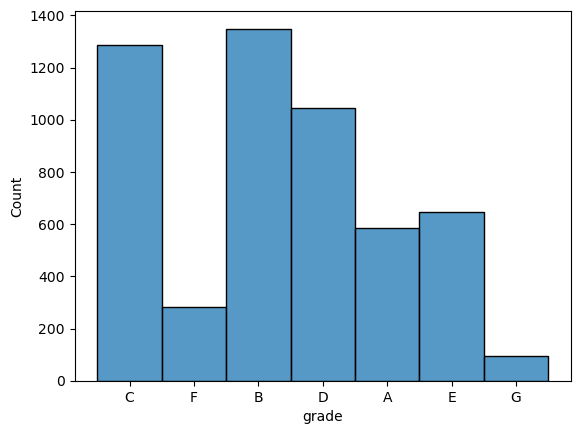

In [97]:
sns.histplot(binwidth=0.5, x="grade", data=lending_data[lending_data['loan_status'] == 'Charged Off'], stat="count", multiple="stack")
#sns.stripplot(x="Mother.edu", y="Siblings", data=df7);


In [93]:
# We can just remove the grades from the subgrades to make the visualization more readable
# Also order of the grades is haphazard we can handle that within the plot

lending_data['sub_grade'] = pd.to_numeric(lending_data['sub_grade'].apply(lambda x : x[-1]))
lending_data['sub_grade'].head()

0    2
1    4
2    5
3    1
5    4
Name: sub_grade, dtype: int64

<Axes: xlabel='grade', ylabel='count'>

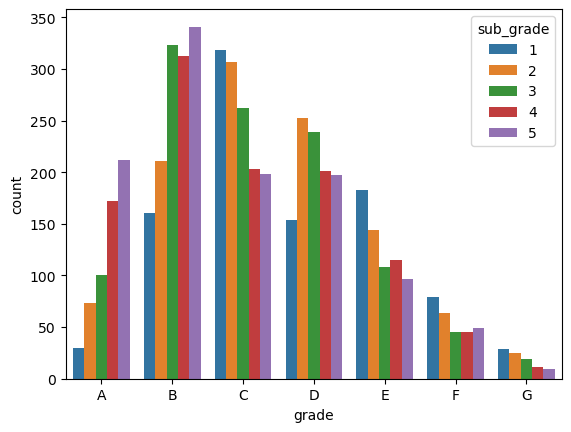

In [96]:
sns.countplot(x="grade",order = ['A', 'B', 'C', 'D', 'E', 'F', 'G'], hue="sub_grade", data=lending_data[lending_data['loan_status'] == 'Charged Off'])


In [98]:
lending_data['home_ownership'].value_counts()

RENT        17628
MORTGAGE    15443
OWN          2786
OTHER          91
Name: home_ownership, dtype: int64

<Axes: xlabel='home_ownership', ylabel='count'>

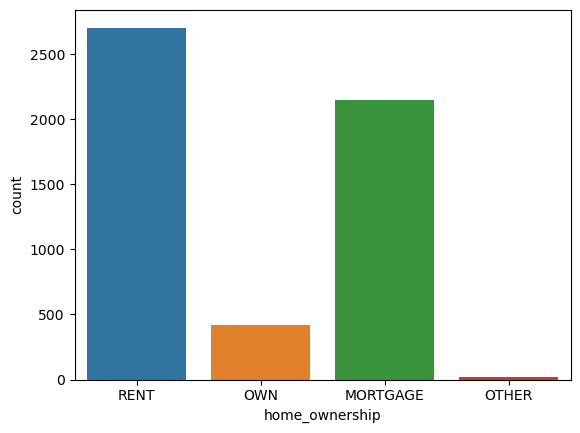

In [99]:
sns.countplot(x="home_ownership", data=lending_data[lending_data['loan_status'] == 'Charged Off'])


<Axes: xlabel='grade', ylabel='count'>

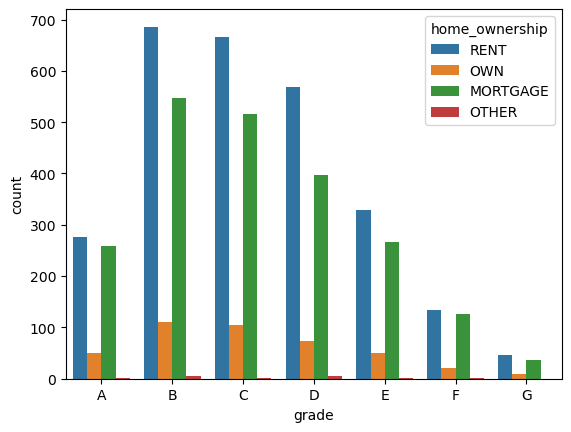

In [100]:
sns.countplot(x="grade",order = ['A', 'B', 'C', 'D', 'E', 'F', 'G'], hue="home_ownership", data=lending_data[lending_data['loan_status'] == 'Charged Off'])


<Axes: xlabel='emp_length', ylabel='count'>

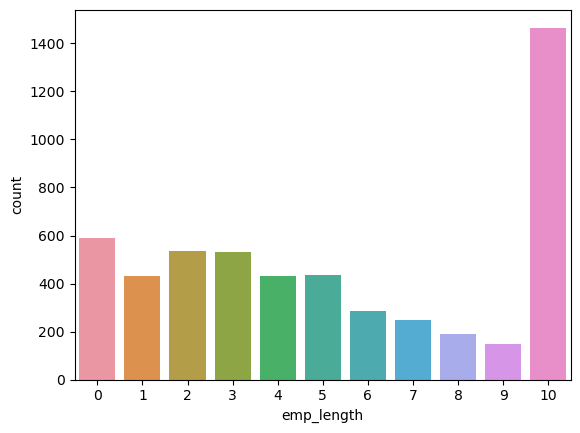

In [102]:
sns.countplot(x="emp_length", data=lending_data[lending_data['loan_status'] == 'Charged Off'])


<Axes: xlabel='term', ylabel='count'>

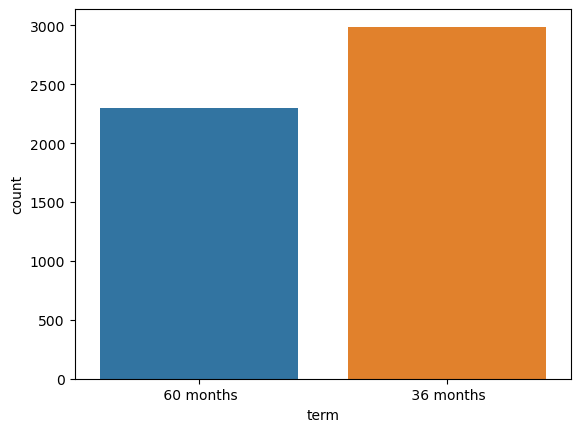

In [103]:
sns.countplot(x="term", data=lending_data[lending_data['loan_status'] == 'Charged Off'])


<Axes: xlabel='count', ylabel='purpose'>

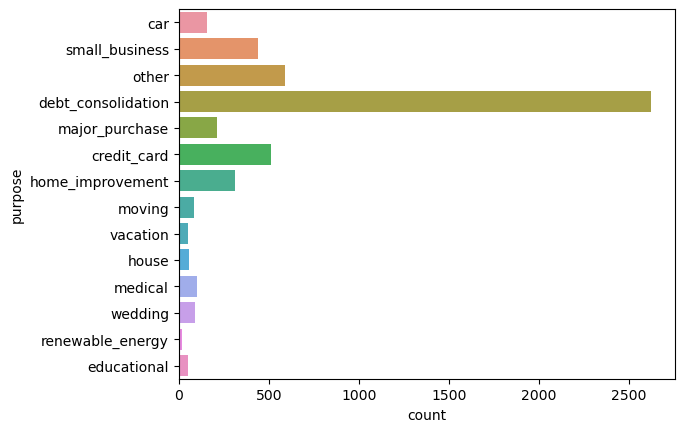

In [107]:
sns.countplot(y="purpose", data=lending_data[lending_data['loan_status'] == 'Charged Off'])


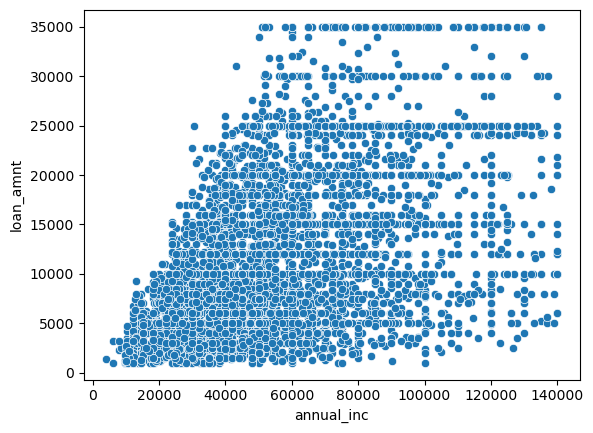

In [109]:
sns.scatterplot(x="annual_inc", y="loan_amnt", data=lending_data[lending_data['loan_status'] == 'Charged Off']);

In [110]:
lending_data['annual_income_bins'] = pd.cut(lending_data['annual_inc'], bins=5,precision =0,labels =['3k-31k','31k-58k','58k-85k','85k-112k','112k-140k'])
lending_data['loan_amount_bins'] = pd.cut(lending_data['loan_amnt'], bins=7,precision =0,labels=['0-5k','5k-10k','10k-15k','15k-20k','20k-25k','25k-30k','30k-35k'])
lending_data.head()

,loan_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,...,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,pub_rec_bankruptcies,tax_liens,annual_income_bins,loan_amount_bins
0,5000,4975.0,36 months,10.6,162.87,B,2,10,RENT,24000.0,...,0,13648,83.7,9,f,INDIVIDUAL,0.0,0.0,3k-31k,0-5k
1,2500,2500.0,60 months,15.2,59.83,C,4,0,RENT,30000.0,...,0,1687,9.4,4,f,INDIVIDUAL,0.0,0.0,3k-31k,0-5k
2,2400,2400.0,36 months,15.9,84.33,C,5,10,RENT,12252.0,...,0,2956,98.5,10,f,INDIVIDUAL,0.0,0.0,3k-31k,0-5k
3,10000,10000.0,36 months,13.4,339.31,C,1,10,RENT,49200.0,...,0,5598,2.0,37,f,INDIVIDUAL,0.0,0.0,31k-58k,5k-10k
5,5000,5000.0,36 months,7.9,156.46,A,4,3,RENT,36000.0,...,0,7963,28.3,12,f,INDIVIDUAL,0.0,0.0,31k-58k,0-5k


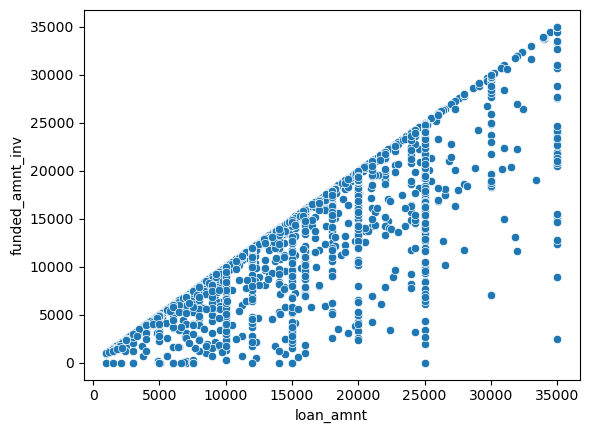

In [115]:
sns.scatterplot(y="funded_amnt_inv", x="loan_amnt", data=lending_data[lending_data['loan_status'] == 'Charged Off']);

In [118]:
column_names = lending_data.columns.values.tolist()
print(column_names)

['loan_amnt', 'funded_amnt_inv', 'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_length', 'home_ownership', 'annual_inc', 'verification_status', 'issue_d', 'loan_status', 'pymnt_plan', 'purpose', 'dti', 'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc', 'initial_list_status', 'application_type', 'pub_rec_bankruptcies', 'tax_liens', 'annual_income_bins', 'loan_amount_bins']


In [207]:
lending_data_grades = lending_data
lending_data_grades = lending_data_grades[lending_data_grades['grade'] == 'B']
lending_data_grades.head()


,loan_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,...,application_type,pub_rec_bankruptcies,tax_liens,annual_income_bins,loan_amount_bins,issue_month,issue_year,total_acc_bins,funded_amnt_inv_bins,dti_bins
0,5000,4975.0,36 months,10.6,162.87,B,2,10,RENT,24000.0,...,INDIVIDUAL,0.0,0.0,3k-31k,0-5k,Dec,2011,1-20,0-5k,20-25
9,5375,5350.0,60 months,12.6,121.45,B,5,0,RENT,15000.0,...,INDIVIDUAL,0.0,0.0,3k-31k,0-5k,Dec,2011,1-20,5k-10k,15-20
11,12000,12000.0,36 months,12.6,402.54,B,5,10,OWN,75000.0,...,INDIVIDUAL,0.0,0.0,58k-85k,10k-15k,Dec,2011,20-40,10k-15k,5-10
13,3000,3000.0,36 months,9.9,96.68,B,1,3,RENT,15000.0,...,INDIVIDUAL,0.0,0.0,3k-31k,0-5k,Dec,2011,1-20,0-5k,10-15
14,10000,10000.0,36 months,10.6,325.74,B,2,3,RENT,100000.0,...,INDIVIDUAL,0.0,0.0,85k-112k,5k-10k,Dec,2011,20-40,5k-10k,5-10


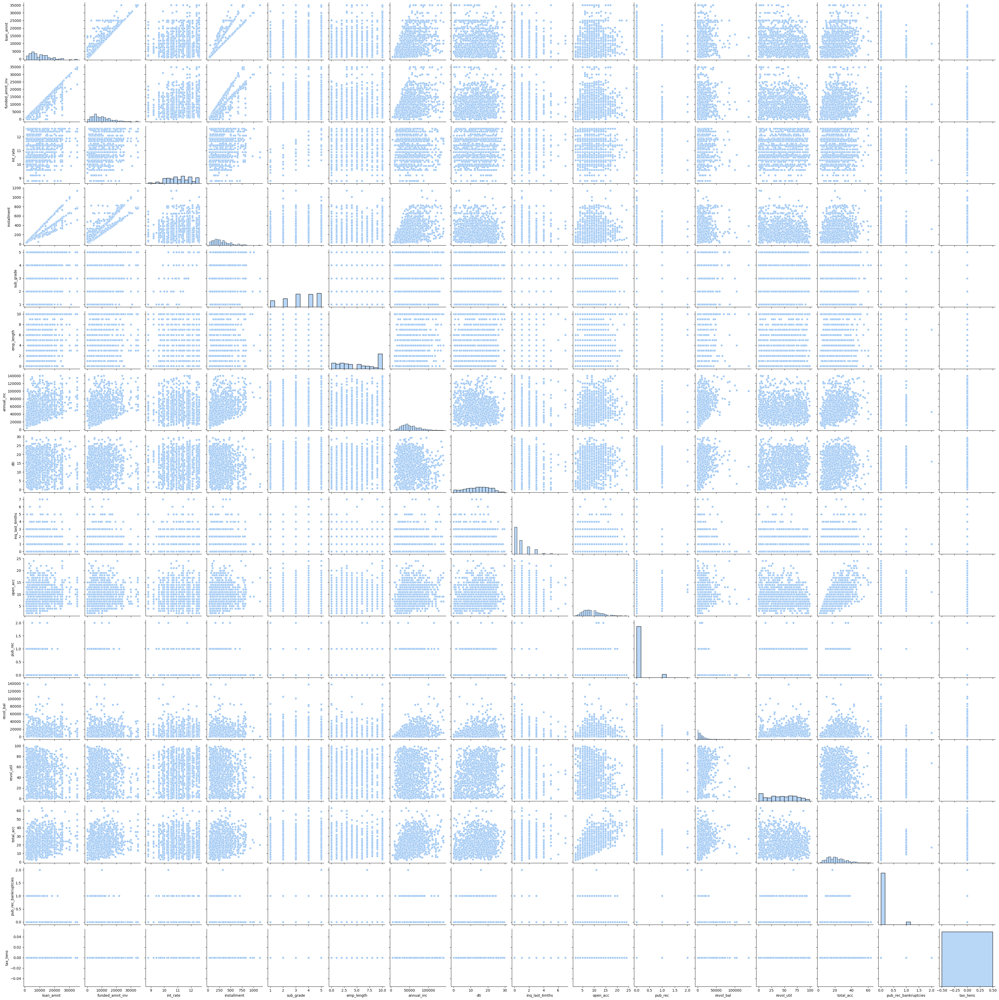

In [208]:
# B grade loans which exhibited highest default rates with a separate analysis

sns.pairplot(data=lending_data_grades[lending_data_grades['loan_status'] == 'Charged Off'])

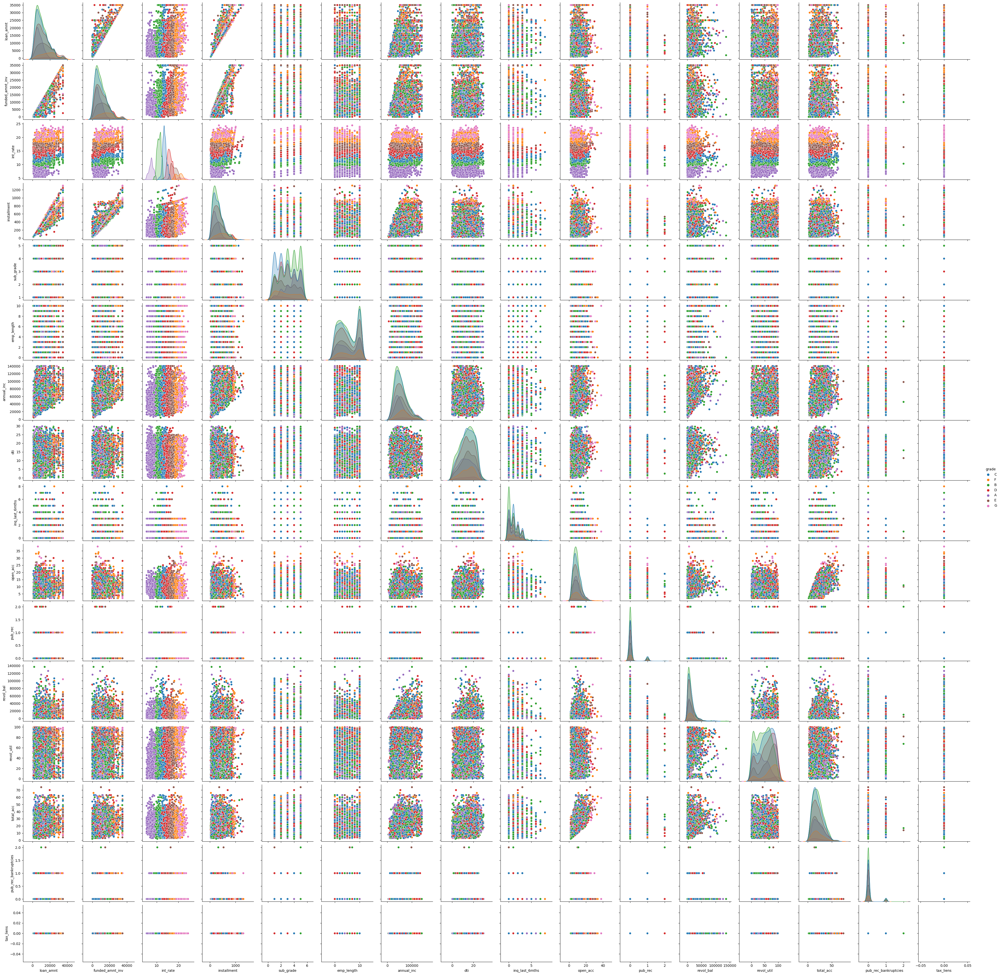

In [124]:
sns.pairplot(data=lending_data[lending_data['loan_status'] == 'Charged Off'], hue="grade")

In [126]:
# lending_data['issue_d'] = pd.to_datetime(lending_data['issue_d'])
lending_data['issue_d'].value_counts

<bound method IndexOpsMixin.value_counts of 0        Dec-11
1        Dec-11
2        Dec-11
3        Dec-11
5        Dec-11
          ...  
39562    Nov-07
39573    Nov-07
39623    Oct-07
39666    Aug-07
39680    Aug-07
Name: issue_d, Length: 35948, dtype: object>

In [147]:
df_month_year = lending_data['issue_d'].str.partition("-")
lending_data['issue_month'] = df_month_year[0]                     
lending_data['issue_year']='20' + df_month_year[2]

lending_data.head()

,loan_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,...,revol_util,total_acc,initial_list_status,application_type,pub_rec_bankruptcies,tax_liens,annual_income_bins,loan_amount_bins,issue_month,issue_year
0,5000,4975.0,36 months,10.6,162.87,B,2,10,RENT,24000.0,...,83.7,9,f,INDIVIDUAL,0.0,0.0,3k-31k,0-5k,Dec,2011
1,2500,2500.0,60 months,15.2,59.83,C,4,0,RENT,30000.0,...,9.4,4,f,INDIVIDUAL,0.0,0.0,3k-31k,0-5k,Dec,2011
2,2400,2400.0,36 months,15.9,84.33,C,5,10,RENT,12252.0,...,98.5,10,f,INDIVIDUAL,0.0,0.0,3k-31k,0-5k,Dec,2011
3,10000,10000.0,36 months,13.4,339.31,C,1,10,RENT,49200.0,...,2.0,37,f,INDIVIDUAL,0.0,0.0,31k-58k,5k-10k,Dec,2011
5,5000,5000.0,36 months,7.9,156.46,A,4,3,RENT,36000.0,...,28.3,12,f,INDIVIDUAL,0.0,0.0,31k-58k,0-5k,Dec,2011


In [148]:
lending_data['issue_month'].value_counts

<bound method IndexOpsMixin.value_counts of 0        Dec
1        Dec
2        Dec
3        Dec
5        Dec
        ... 
39562    Nov
39573    Nov
39623    Oct
39666    Aug
39680    Aug
Name: issue_month, Length: 35948, dtype: object>

<Axes: xlabel='issue_year', ylabel='count'>

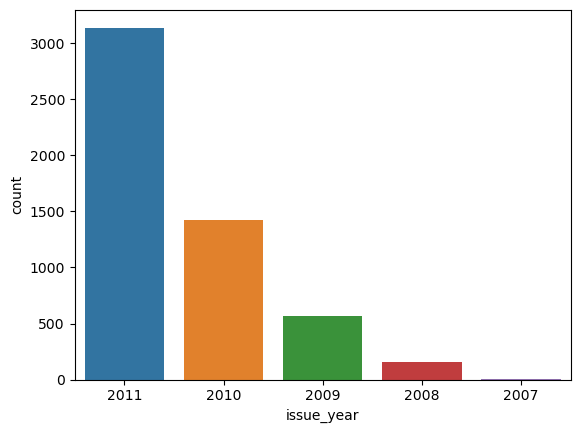

In [149]:
sns.countplot(x="issue_year", data=lending_data[lending_data['loan_status'] == 'Charged Off'])


<Axes: xlabel='annual_income_bins', ylabel='count'>

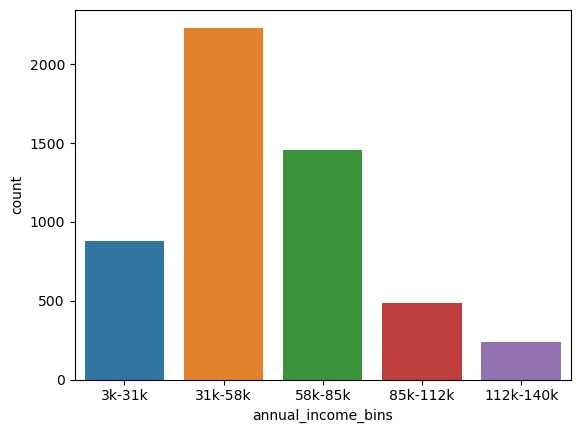

In [158]:
sns.countplot(x='annual_income_bins', data=lending_data[lending_data['loan_status'] == 'Charged Off'])

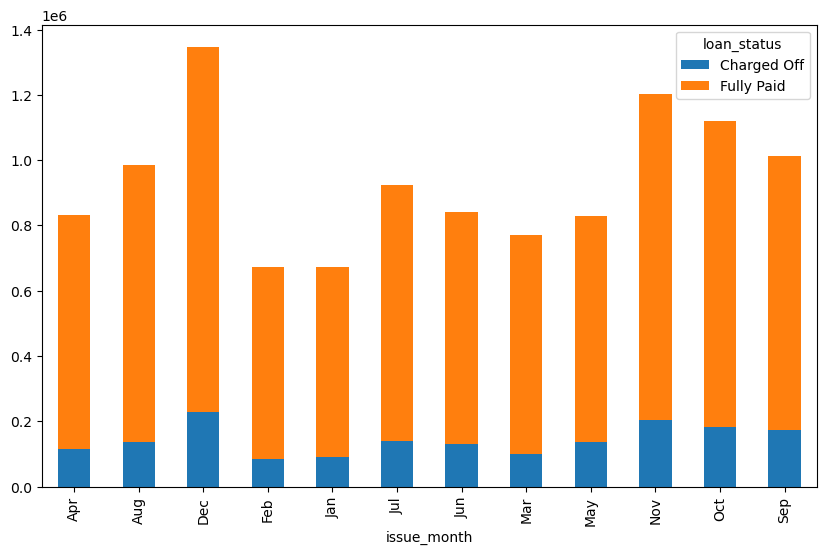

In [155]:
monthly = pd.pivot_table(data=lending_data, values="installment", index="issue_month", columns="loan_status", aggfunc=sum)

monthly.plot(kind="bar", stacked="True", figsize=[10,6])
plt.show()

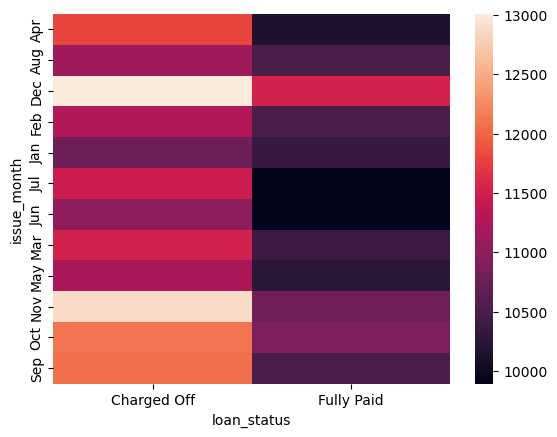

In [156]:
res = pd.pivot_table(data=lending_data,index="issue_month",columns="loan_status",values="loan_amnt")

sns.heatmap(res)
plt.show()

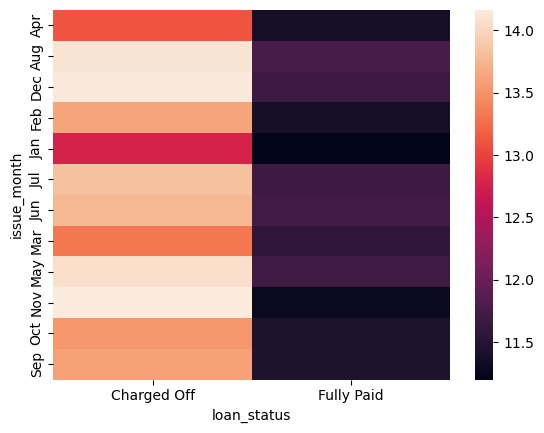

In [157]:
# Higher loan amounts and higher losses/defaults seen in last two months of the year
# Most of the charged off loans were higher amount loans

res1 = pd.pivot_table(data=lending_data,index="issue_month",columns="loan_status",values="int_rate")

sns.heatmap(res1)
plt.show()

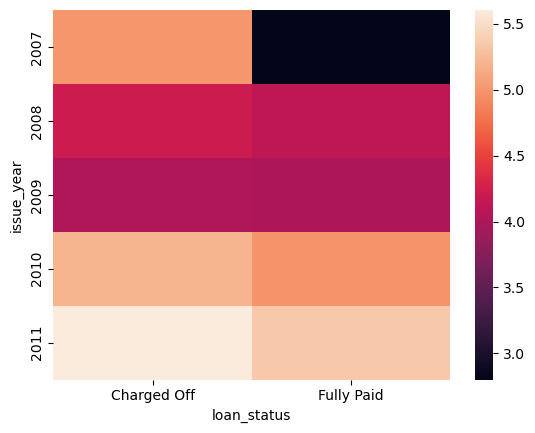

In [189]:
# Higher loan amounts and higher losses/defaults seen in last two months of the year
# Most of the charged off loans were higher amount loans

res5 = pd.pivot_table(data=lending_data,index="issue_year",columns="loan_status",values="emp_length")

sns.heatmap(res5)
plt.show()

<Axes: xlabel='term', ylabel='Count'>

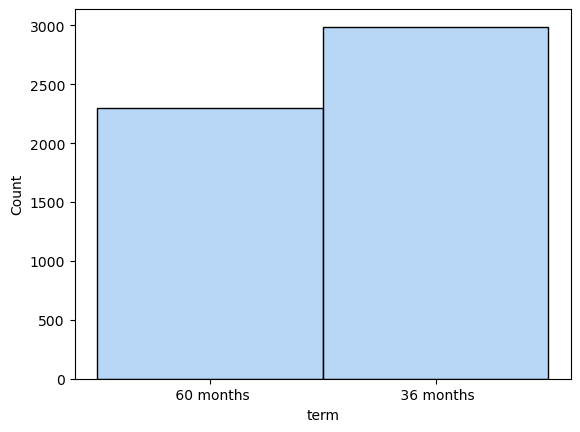

In [160]:
# We can also observe that simulataneously the interest rates have been high for loans that have been charged off
sns.set_palette("pastel")
sns.histplot(binwidth=0.5, x="term", data=lending_data[lending_data['loan_status'] == 'Charged Off'], stat="count", multiple="stack")
#sns.stripplot(x="Mother.edu", y="Siblings", data=df7);



<Axes: xlabel='verification_status', ylabel='Count'>

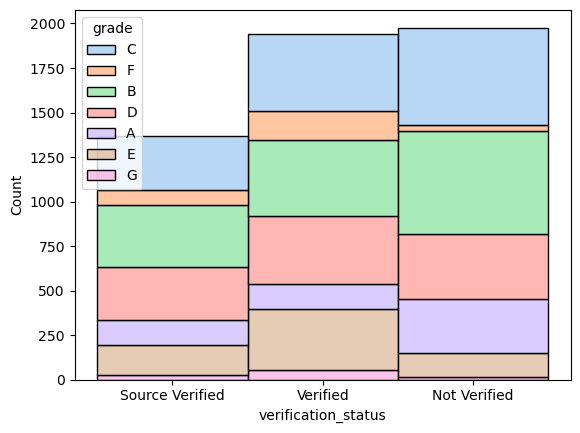

In [165]:
sns.histplot(binwidth=0.5, x="verification_status", data=lending_data[lending_data['loan_status'] == 'Charged Off'], stat="count" ,hue="grade",multiple="stack")
#sns.stripplot(x="Mother.edu", y="Siblings", data=df7);


<Axes: xlabel='pub_rec', ylabel='Count'>

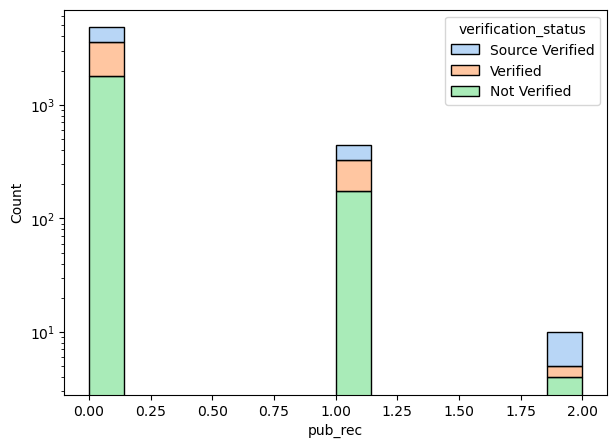

In [170]:
# Also we can note the grade of loans are mostly B and C for even income verified borrowers
fig,ax = plt.subplots(figsize = (7,5))
ax.set_yscale('log')
sns.histplot(x="pub_rec", data=lending_data[lending_data['loan_status'] == 'Charged Off'], stat="count",hue="verification_status",multiple="stack" )


In [174]:
lending_data['pub_rec'].value_counts()

0    33951
1     1944
2       45
3        6
4        2
Name: pub_rec, dtype: int64

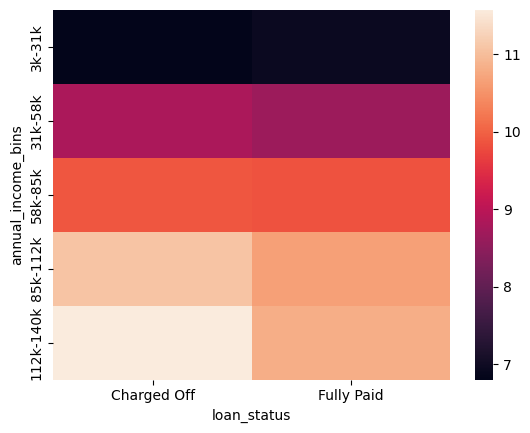

In [176]:
res2 = pd.pivot_table(data=lending_data,index="annual_income_bins",columns="loan_status",values="open_acc")

sns.heatmap(res2)
plt.show()

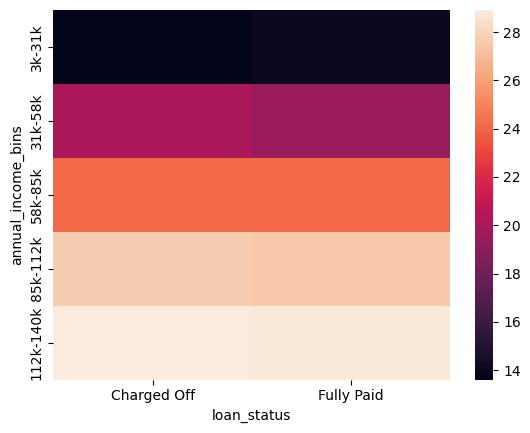

In [177]:
#We can observe a clear correlation between the number of open credit lines and higher income for charged off loans

res3 = pd.pivot_table(data=lending_data,index="annual_income_bins",columns="loan_status",values="total_acc")

sns.heatmap(res3)
plt.show()

In [179]:
lending_data['total_acc_bins'] = pd.cut(lending_data['total_acc'], bins=4,precision =0,labels =['1-20','20-40','60-80','80-100'])
lending_data['funded_amnt_inv_bins'] = pd.cut(lending_data['funded_amnt_inv'], bins=7,labels=['0-5k','5k-10k','10k-15k','15k-20k','20k-25k','25k-30k','30k-35k'])
lending_data['dti_bins'] = pd.cut(lending_data['dti'], bins=5,precision =0,labels=['0-5','5-10','10-15','15-20','20-25'])
lending_data.head()

,loan_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,...,application_type,pub_rec_bankruptcies,tax_liens,annual_income_bins,loan_amount_bins,issue_month,issue_year,total_acc_bins,funded_amnt_inv_bins,dti_bins
0,5000,4975.0,36 months,10.6,162.87,B,2,10,RENT,24000.0,...,INDIVIDUAL,0.0,0.0,3k-31k,0-5k,Dec,2011,1-20,0-5k,20-25
1,2500,2500.0,60 months,15.2,59.83,C,4,0,RENT,30000.0,...,INDIVIDUAL,0.0,0.0,3k-31k,0-5k,Dec,2011,1-20,0-5k,0-5
2,2400,2400.0,36 months,15.9,84.33,C,5,10,RENT,12252.0,...,INDIVIDUAL,0.0,0.0,3k-31k,0-5k,Dec,2011,1-20,0-5k,5-10
3,10000,10000.0,36 months,13.4,339.31,C,1,10,RENT,49200.0,...,INDIVIDUAL,0.0,0.0,31k-58k,5k-10k,Dec,2011,20-40,5k-10k,15-20
5,5000,5000.0,36 months,7.9,156.46,A,4,3,RENT,36000.0,...,INDIVIDUAL,0.0,0.0,31k-58k,0-5k,Dec,2011,1-20,0-5k,5-10


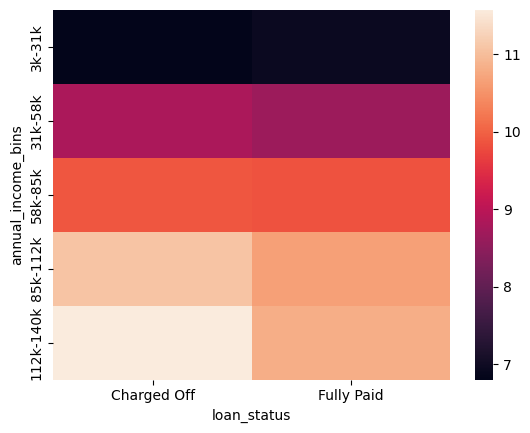

In [198]:
res9 = pd.pivot_table(data=lending_data,index="annual_income_bins",columns="loan_status",values="open_acc")

sns.heatmap(res9)
plt.show()

<Axes: xlabel='count', ylabel='open_acc'>

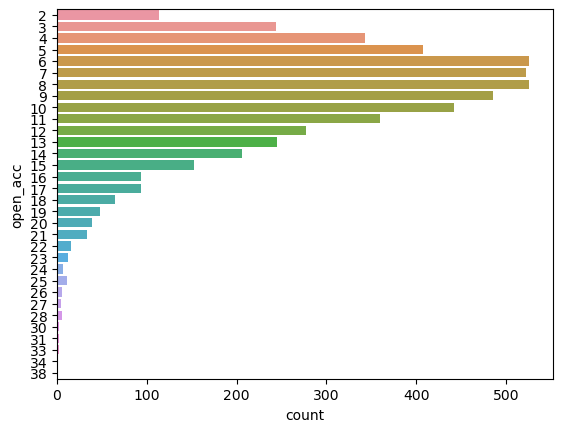

In [196]:
sns.countplot(y='open_acc', data=lending_data[lending_data['loan_status'] == 'Charged Off'])

<Axes: xlabel='dti_bins', ylabel='count'>

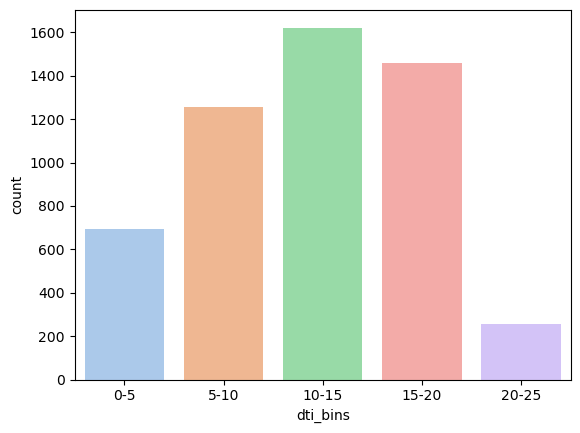

In [180]:
sns.countplot(x='dti_bins', data=lending_data[lending_data['loan_status'] == 'Charged Off'])

<Axes: xlabel='count', ylabel='purpose'>

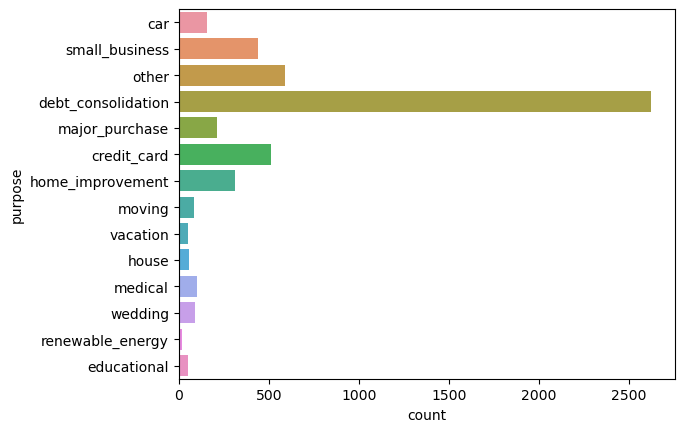

In [183]:
sns.countplot(y='purpose', data=lending_data[lending_data['loan_status'] == 'Charged Off'])

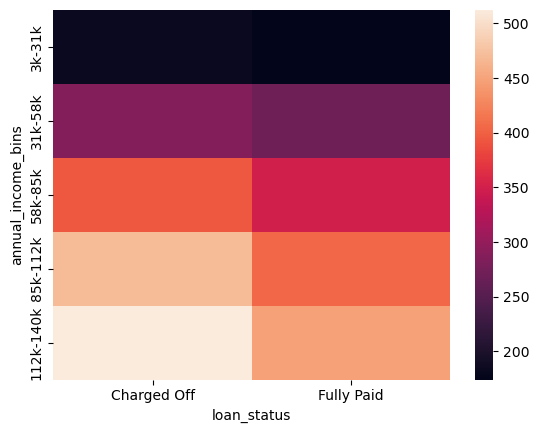

In [192]:
res7 = pd.pivot_table(data=lending_data,index="annual_income_bins",columns="loan_status",values="installment")

sns.heatmap(res7)
plt.show()

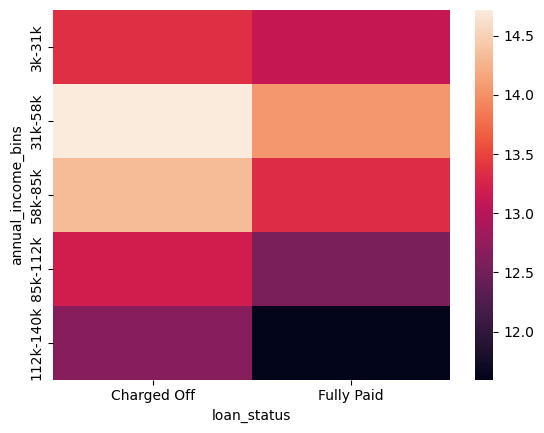

In [181]:
res4 = pd.pivot_table(data=lending_data,index="annual_income_bins",columns="loan_status",values="dti")

sns.heatmap(res4)
plt.show()

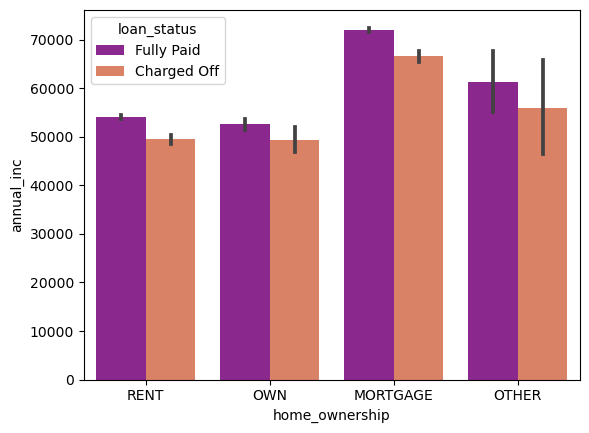

In [186]:
sns.barplot(data =lending_data,x='home_ownership', y='annual_inc', hue ='loan_status',palette="plasma")
plt.show()

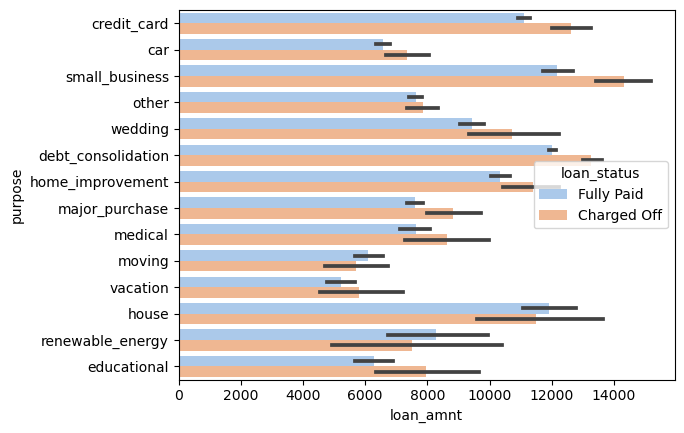

In [187]:
sns.barplot(data =lending_data,x='loan_amnt', y='purpose', hue ='loan_status',palette="pastel")
plt.show()

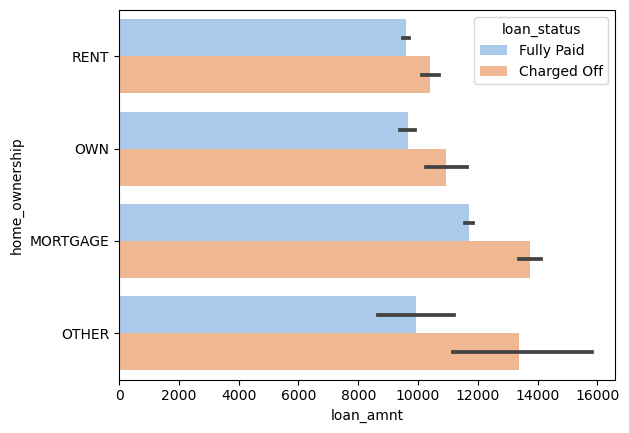

In [188]:
sns.barplot(data =lending_data,x='loan_amnt', y='home_ownership', hue ='loan_status',palette="pastel")
plt.show()

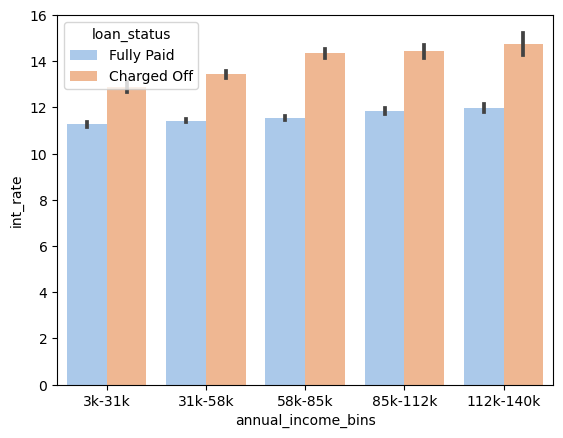

In [191]:
sns.barplot(data =lending_data,x='annual_income_bins', y='int_rate', hue ='loan_status',palette="pastel")
plt.show()

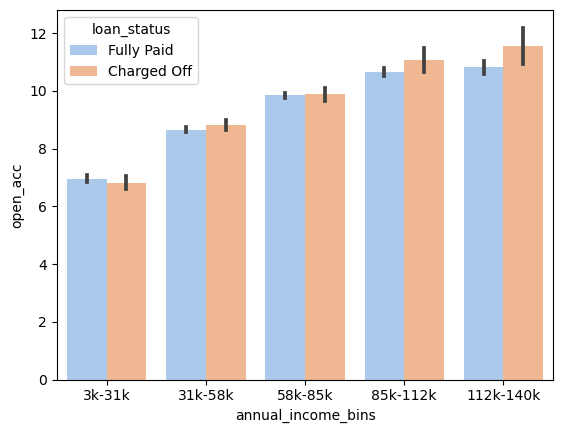

In [199]:
sns.barplot(data =lending_data,x='annual_income_bins', y='open_acc', hue ='loan_status',palette="pastel")
plt.show()

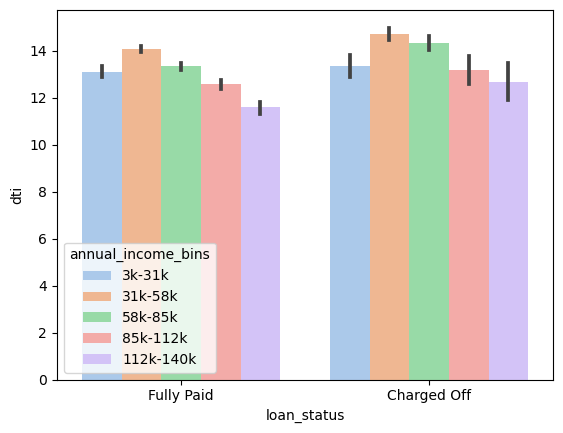

In [210]:
sns.barplot(data =lending_data,x='loan_status', y='dti',hue ='annual_income_bins', palette="pastel")
plt.show()

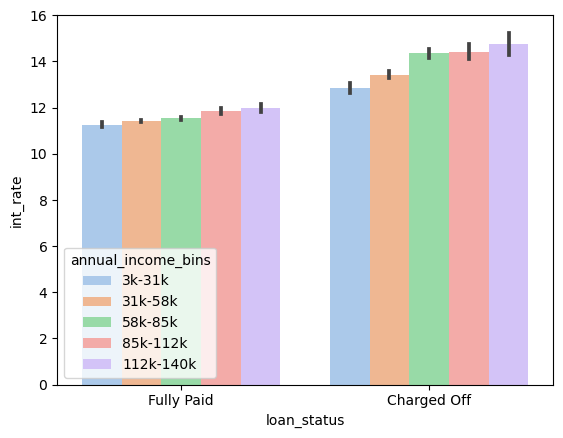

In [211]:
sns.barplot(data =lending_data,x='loan_status', y='int_rate',hue ='annual_income_bins', palette="pastel")
plt.show()

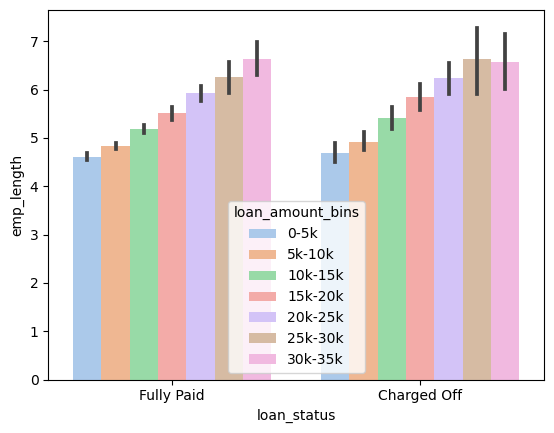

In [212]:
sns.barplot(data =lending_data,x='loan_status', y='emp_length',hue ='loan_amount_bins', palette="pastel")
plt.show()

<Axes: xlabel='verification_status', ylabel='count'>

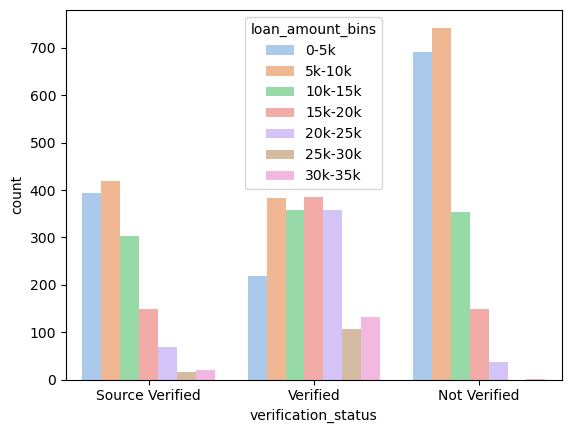

In [213]:
sns.countplot(x='verification_status', data=lending_data[lending_data['loan_status'] == 'Charged Off'] ,hue ='loan_amount_bins')